Daniil Abbruzzese
Github username: Daniilab
USC ID: 4721123667

In [1]:
import pandas as pd
from sklearn.impute import KNNImputer
import numpy as np
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, roc_curve, auc, accuracy_score
import xgboost as xgb
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold, train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix, roc_auc_score, accuracy_score, roc_curve
from collections import Counter
from IPython.display import display, Image
from pdf2image import convert_from_path

# 1 (a)

The dataset contains a training set and a test
set. The training set contains 60,000 rows, of which 1,000 belong to the positive
class and 171 columns, of which one is the class column. All attributes are nu-
meric

In [18]:
train_df = pd.read_csv('../data/aps_failure_training_set.csv', skiprows=20)

test_df = pd.read_csv('../data/aps_failure_test_set.csv', skiprows=20)

train_df = train_df.replace("pos", 1)
train_df = train_df.replace("neg", 0)

test_df  = test_df.replace("pos", 1)
test_df  = test_df.replace("neg", 0)

train_df.replace("na", np.nan, inplace=True)
test_df.replace("na", np.nan, inplace=True)


pd.set_option('display.max_columns', None)

test_df



,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,ag_005,ag_006,ag_007,ag_008,ag_009,ah_000,ai_000,aj_000,ak_000,al_000,am_0,an_000,ao_000,ap_000,aq_000,ar_000,as_000,at_000,au_000,av_000,ax_000,ay_000,ay_001,ay_002,ay_003,ay_004,ay_005,ay_006,ay_007,ay_008,ay_009,az_000,az_001,az_002,az_003,az_004,az_005,az_006,az_007,az_008,az_009,ba_000,ba_001,ba_002,ba_003,ba_004,ba_005,ba_006,ba_007,ba_008,ba_009,bb_000,bc_000,bd_000,be_000,bf_000,bg_000,bh_000,bi_000,bj_000,bk_000,bl_000,bm_000,bn_000,bo_000,bp_000,bq_000,br_000,bs_000,bt_000,bu_000,bv_000,bx_000,by_000,bz_000,ca_000,cb_000,cc_000,cd_000,ce_000,cf_000,cg_000,ch_000,ci_000,cj_000,ck_000,cl_000,cm_000,cn_000,cn_001,cn_002,cn_003,cn_004,cn_005,cn_006,cn_007,cn_008,cn_009,co_000,cp_000,cq_000,cr_000,cs_000,cs_001,cs_002,cs_003,cs_004,cs_005,cs_006,cs_007,cs_008,cs_009,ct_000,cu_000,cv_000,cx_000,cy_000,cz_000,da_000,db_000,dc_000,dd_000,de_000,df_000,dg_000,dh_000,di_000,dj_000,dk_000,dl_000,dm_000,dn_000,do_000,dp_000,dq_000,dr_000,ds_000,dt_000,du_000,dv_000,dx_000,dy_000,dz_000,ea_000,eb_000,ec_00,ed_000,ee_000,ee_001,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0,60,0,20,12,0,0,0,0,0,2682,4736,3862,1846,0,0,0,3976,0,0,0,1520,2374,11516,9480,111258,470,0,0,0,0,58,26,0,0,0,0,0,0,0,0,13124,2,1956,434,76,174,190,6198,1148,2948,2,0,8762,2566,480,380,196,516,86,66,74,0,124340,4,6,4,0,3976,318,107662,3458,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,110980,59.53,124340,124340,184970,54,686,12246,123880,13196,1209600,598,0,6,0,5913.6,0,5851.2,6,30,0,2,5512,4674,1388,1508,38,4,0,0,8,12,124340,0,1550,14,36,26,920,430,7650,2294,206,0,22,42,5336,1276,0,0,0,0,6598,70,112,0,0,0,0,0,0,0,0,340,0,0,1100,574,232,66,780,882,0,4,0,0,0,465.5,90,7502,3156,1098,138,412,654,78,88,0,0,0,0
1,0,82,0,68,40,0,0,0,0,0,0,748,12594,3636,0,0,0,5244,0,60,0,0,0,23174,18166,23686,1270,0,0,0,0,12,82,0,0,0,0,0,0,0,692,16286,0,280,44,50,1274,866,3362,11102,0,0,0,12564,1756,638,276,172,132,812,308,192,128,46894,4,2,38,0,5244,360,20520,3134,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23320,81.89,46894,46894,48324,68,0,4486,46480,17050,1209600,726,2,4,0,7224.96,0,7768.32,0,42,0,0,4,7064,6200,2452,1246,12,0,0,14,54,46894,0,2202,28,114,350,700,1708,9622,2174,80,0,80,206,7802,1466,0,0,0,0,7918,78,40,0,0,0,0,0,0,0,0,352,0,0,3996,584,200,62,37580,3756,6368,36,0,0,0,2.86,102,10040,3310,1068,276,1620,116,86,462,0,0,0,0
2,0,66002,2,212,112,0,0,0,0,0,199486,1358536,1952422,452706,25130,520,0,1891670,0,0,0,77898,110548,3605894,3291610,959756,286536,0,0,0,0,106,340,0,0,0,0,0,24286,681260,2808472,474782,0,22984,894,1162,1304,1856,388700,3424812,123828,23260,0,1662580,667960,387998,226078,161558,148288,154908,220820,147744,210866,4644422,958,7848,3624,0,1891670,47066,692800,265492,336240,194360,245240,NaN,NaN,NaN,NaN,NaN,175480,66002.89,4644422,4644422,4608738,22706,2272,95510,1006260,3991552,1209600,126310,0,104,0,3594885.12,0,374649.6,148,720,0,5154,174956,622312,1002504,793938,541734,345896,300806,201500,52,92,4644422,0,24818,964,162660,215004,217930,3038612,322718,6080,14,0,226,572,3593728,1911060,0,284,0,0,3613906,4218,692,0,0,0,0,0,0,0,0,25278,9438,2504,10262714,1278664,109700,19072,9520,4902,4434614,70900,0,0,26002880,2057.84,2158,396312,538136,495076,380368,440134,269556,1315022,153680,516,0,0,0
3,0,59816,NaN,1010,936,0,0,0,0,0,0,123922,984314,1680050,1135268,92606,14038,1772828,0,0,0,1116,2372,3546760,3053176,652616,423374,0,0,7274,0,1622,432,0,0,0,0,0,6388,1091104,2930694,2012,0,3526,904,1426,223226,2663348,1137664,104,0,0,0,1283806,928212,345132,265930,194770,158262,219942,620264,13880,0,4201350,98,238,880,16,1772828,51468,331744,316130,176000,208420,159380,NaN,NaN,NaN,NaN,NaN,100120,59816.46,4201350,4201350,4203050,29967.0,26214,51894,562680,4030198,1209600,114684,0,144,0,3387773.76,38633.28,599624.64,0,0,0,0,14308,475410,1109740,1528024,837114,58942,6220,440,1278,1292,4201350,NaN,6846,810,70090,345884,191284,2454600,926846,33558,280,0,1516,1398,2050280,64066,0,674,0,46,3413978

# 1 (b) i 


In [22]:
warnings.filterwarnings("ignore")

# Initialize the KNN Imputer
imputer = KNNImputer(n_neighbors=3)

# Fit the imputer on the training data
imputer.fit(train_df)

# Transform both the training and test data with the fitted imputer
df_train_imputed = pd.DataFrame(imputer.transform(train_df), columns=train_df.columns)
df_test_imputed = pd.DataFrame(imputer.transform(test_df), columns=test_df.columns)



In [23]:
#writing both imputed data frames to a csv file because it took 63m 42.9s to run the above cell

df_train_imputed.to_csv('../data/df_train_imputed.csv', index = False)

df_test_imputed.to_csv('../data/df_test_imputed.csv', index = False)



# 1 (b) ii


For each of the 170 features, calculate the coefficient of variation CV = s / m
,
where
s
is sample standard deviation and
m
is sample mean.

In [4]:
df_train_imputed = pd.read_csv('../data/df_train_imputed.csv')

df_test_imputed = pd.read_csv('../data/df_test_imputed.csv')

df_imputed = pd.concat([df_train_imputed, df_test_imputed], ignore_index=True)

# Calculate CV for each feature
cv = df_imputed.std() / df_imputed.mean()

cv

class       7.367051
aa_000      4.328608
ab_000      3.474347
ac_000      2.030509
ad_000    274.664350
             ...    
ee_007      4.901741
ee_008      3.357298
ee_009      5.795406
ef_000     47.618631
eg_000     47.034571
Length: 171, dtype: float64

In [4]:
df_imputed

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0.0,76698.0,1.333333,2.130706e+09,280.000000,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,0.0,33058.0,0.000000,0.000000e+00,247.333333,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,0.0,41040.0,0.000000,2.280000e+02,100.000000,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,0.0,12.0,0.000000,7.000000e+01,66.000000,0.0,10.0,0.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,0.0,60874.0,0.000000,1.368000e+03,458.000000,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,0.0,81852.0,1.333333,2.130706e+09,892.000000,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
75996,0.0,18.0,0.000000,5.200000e+01,46.000000,8.0,26.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
75997,0.0,79636.0,0.666667,1.670000e+03,1518.000000,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
75998,0.0,110.0,0.000000,3.600000e+01,32.000000,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


# 1 (b) iii

Plot a correlation matrix for your features using pandas or any other tool.

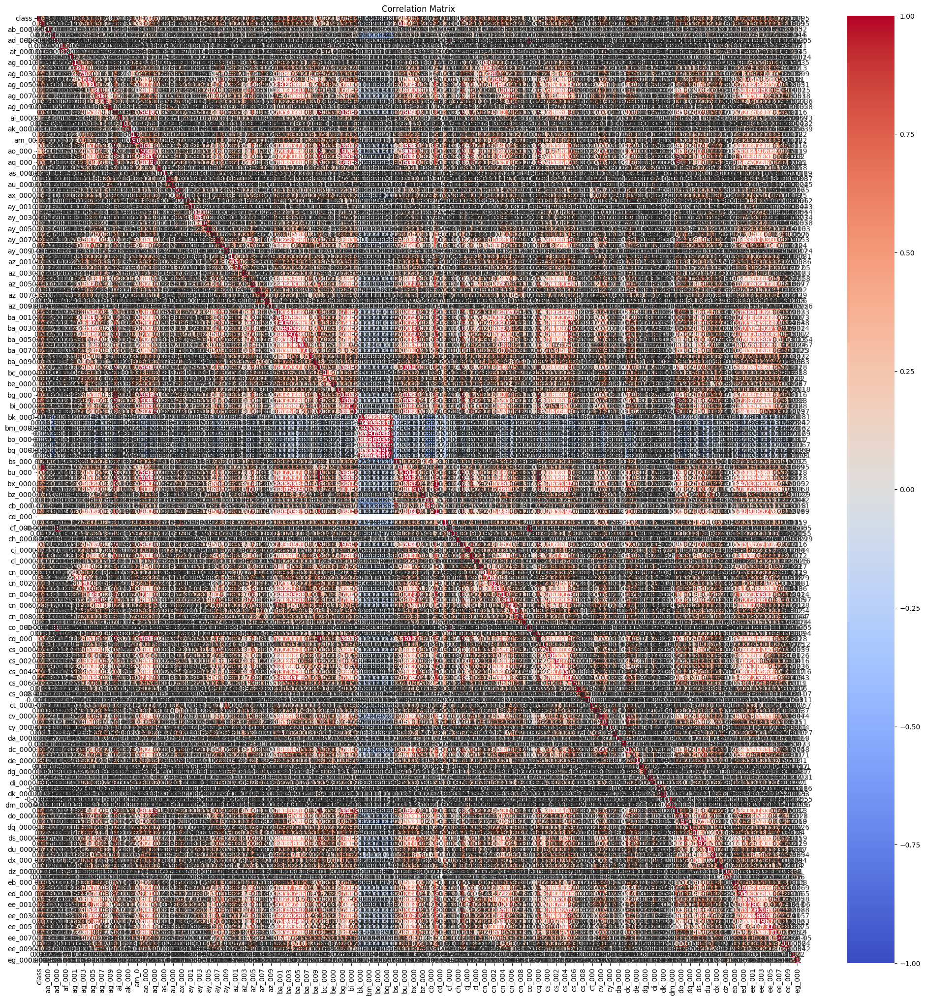

In [5]:

# Calculate the correlation matrix
corr = df_imputed.corr()

# Plot the heatmap
plt.figure(figsize=(25,25))  # Set the figure size
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)

plt.title('Correlation Matrix')
plt.show()

# 1 (b) iv

Pick 13
features with highest
CV
, and make scatter plots and box plots
for them, similar to those on p. 129 of ISLR. Can you draw conclusions about
significance of those features, just by the scatter plots? This does not mean
that you will only use those features in the following questions. We picked
them only for visualization.

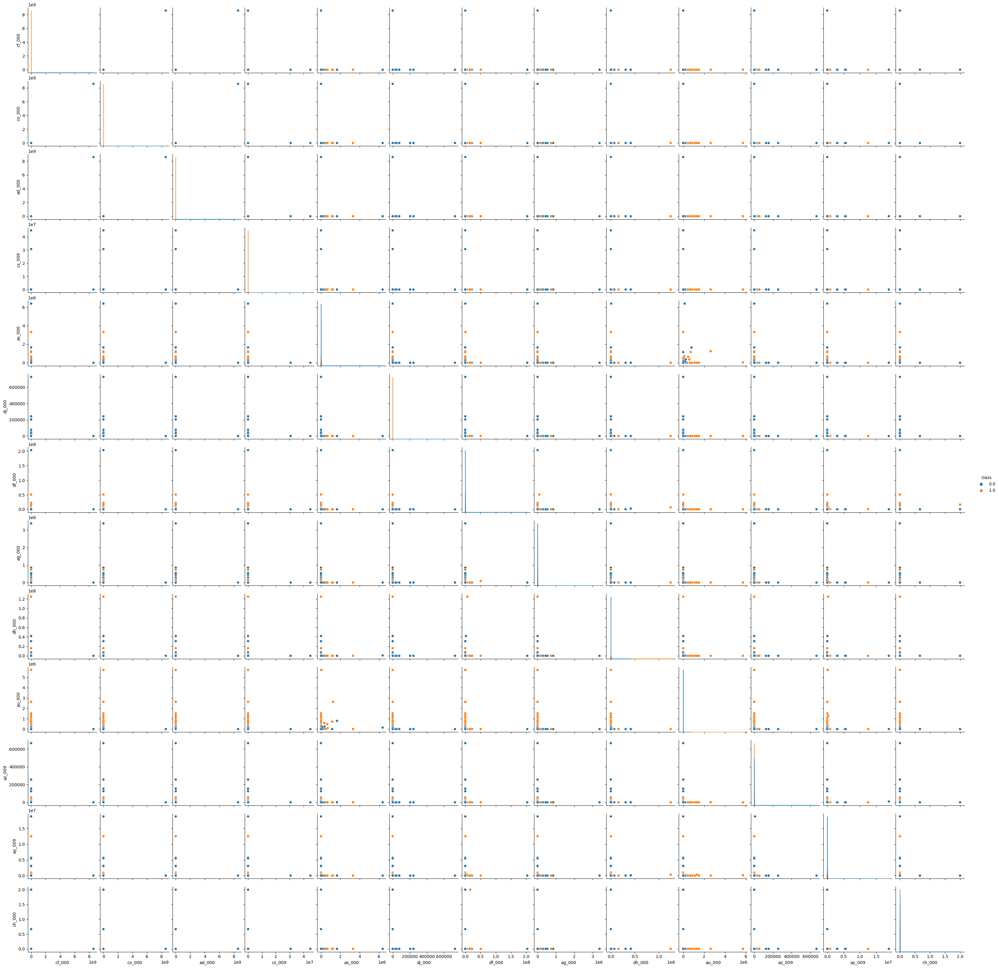

In [5]:
warnings.filterwarnings("ignore")

# Select top 13 features with highest CV
top_features = cv.nlargest(13).index

# Include the class_column along with the top features
selected_columns = list(top_features) + ['class']

# Filter the dataframe for only the selected columns
df_selected = df_imputed[selected_columns]

# Create pairplot with hue
sns.pairplot(df_selected, hue='class')


plt.show()


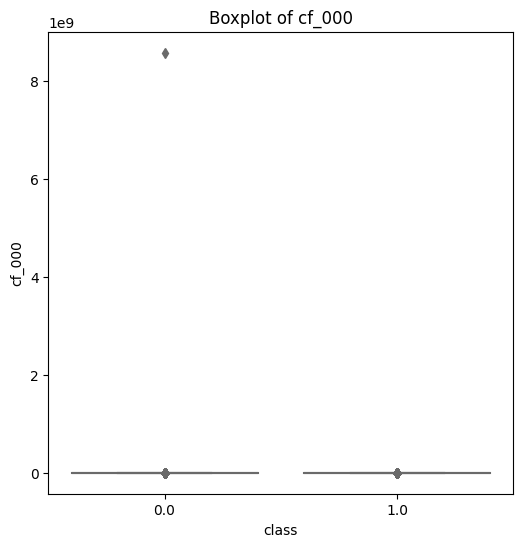

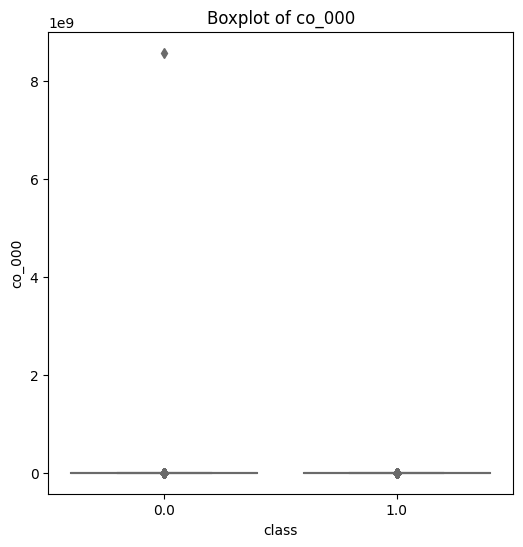

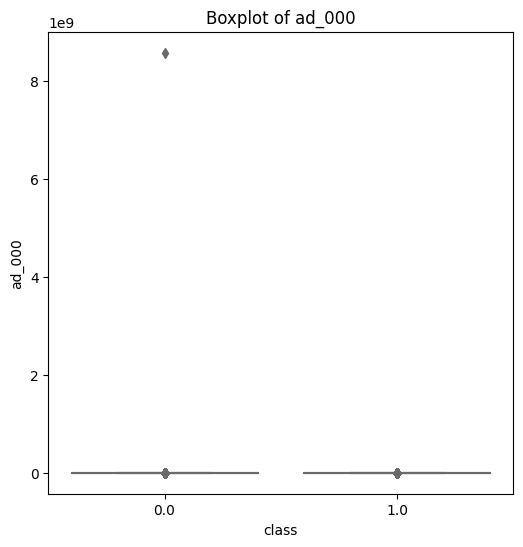

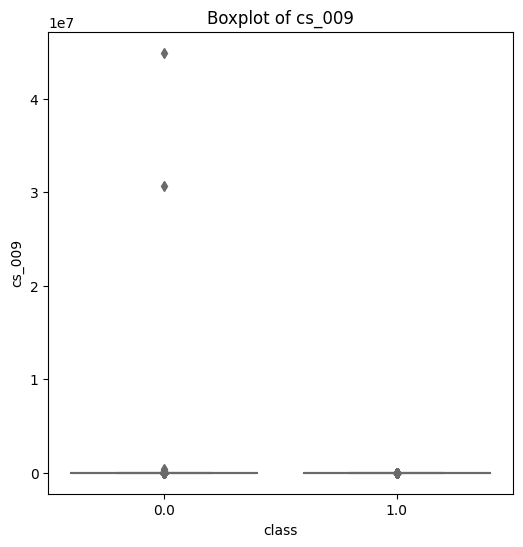

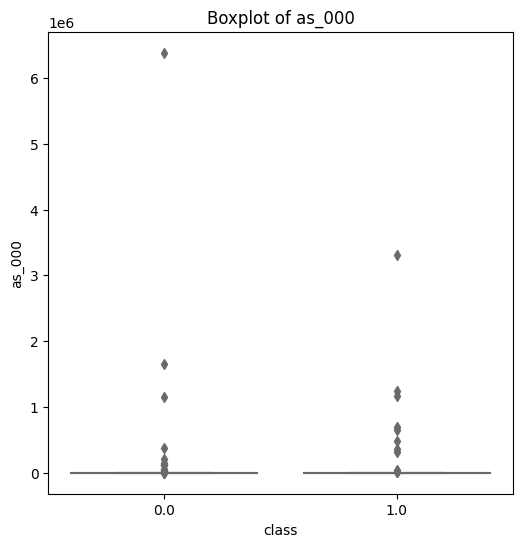

...

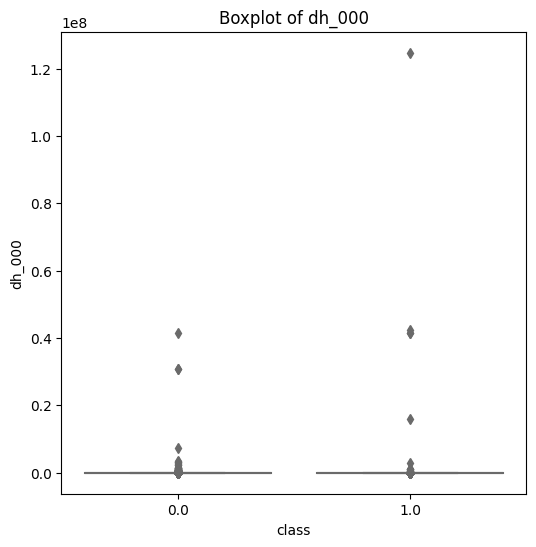

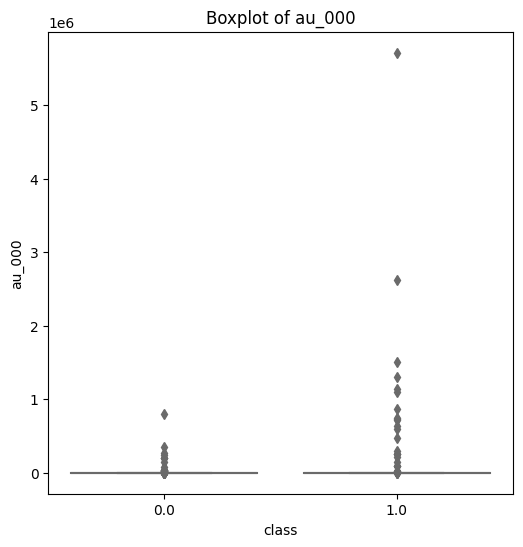

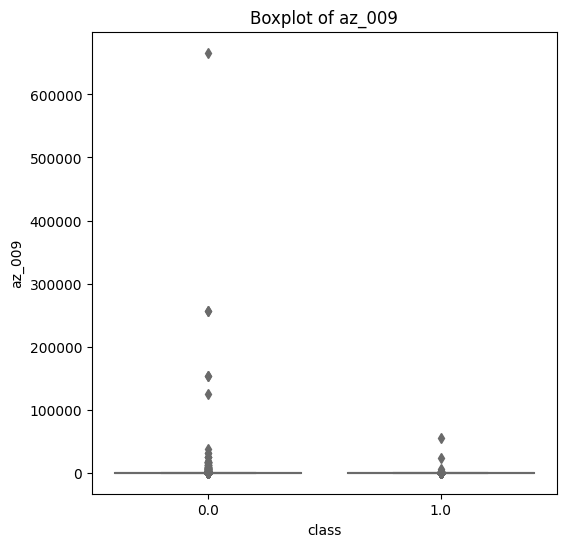

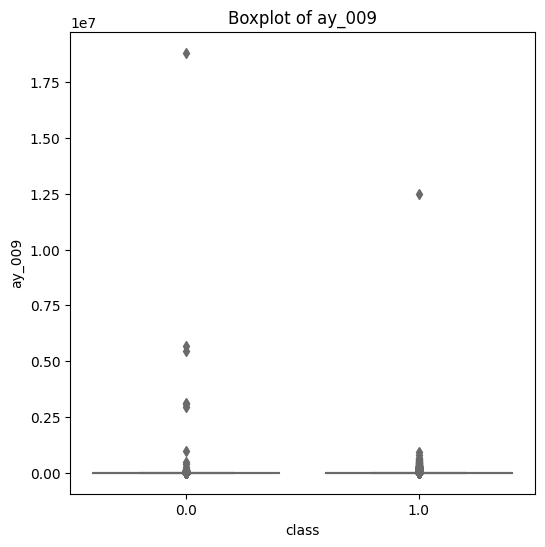

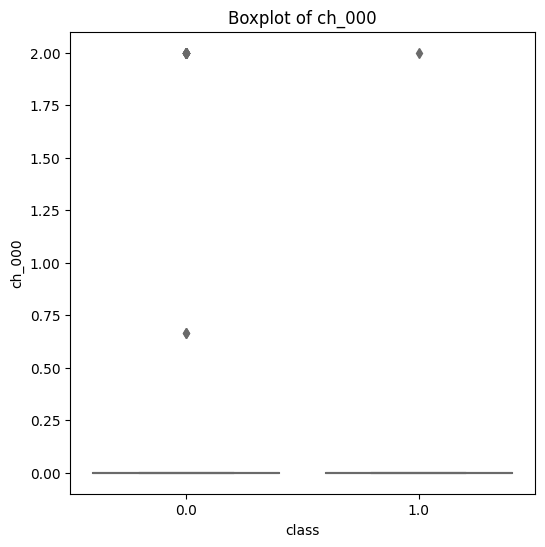

In [8]:
# Create boxplots
for column in df_selected.columns[:-1]:
    plt.figure(figsize=(6, 6))
    sns.boxplot(x='class', y=column, data=df_selected, palette="Set3")
    plt.title(f'Boxplot of {column}')
    plt.show()

### Answer: No you can't draw any conclusions about the features from these scatter plots because they don't indicate impact on the responding variable (class)

# 1 (b) v

Determine the number of positive and negative data. Is this data set imbal-
anced?

In [14]:
df0 = df_imputed[df_imputed['class'] == 0.0]

df1 = df_imputed[df_imputed['class'] == 1.0]

positives = df1.shape[0]

negatives = df0.shape[0]

print(f'The number of positive instances is {positives} and the number of negative instances is {negatives}')



the number of positive instances is 1375 and the number of negative instances is 74625


### Answer: yes, the data set is imbalanced because the negatives far exceed the positives

# 1 (c)

Train a random forest to classify the data set. Do NOT compensate for class
imbalance in the data set. Calculate the confusion matrix, ROC, AUC, and
misclassification for training and test sets and report them (You may use pROC
package). Calculate Out of Bag error estimate for your random forset and compare
it to the test error.

In [5]:

X_train = df_train_imputed.drop('class', axis=1)
y_train = df_train_imputed['class']

X_test = df_test_imputed.drop('class', axis=1)
y_test = df_test_imputed['class']

Training Confusion Matrix:
[[59000     0]
 [    1   999]]

Test Confusion Matrix:
[[15610    15]
 [  109   266]]


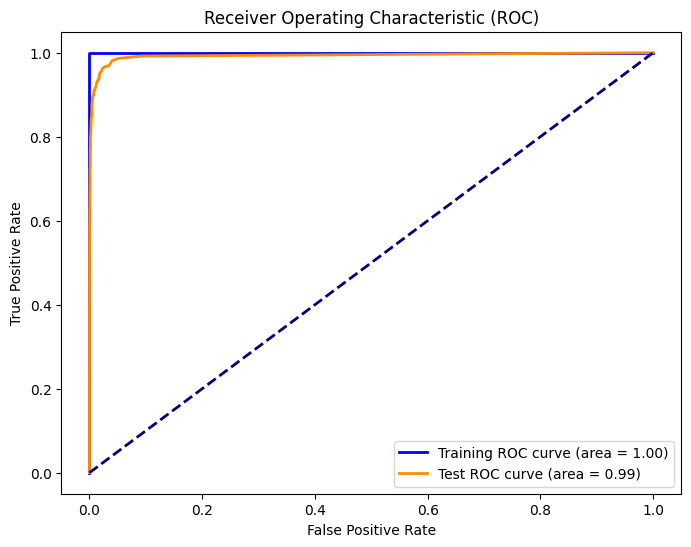

Training Misclassification: 0.0000
Test Misclassification: 0.0078
OOB Error: 0.0064


In [18]:


# Training Random Forest
rf = RandomForestClassifier(n_estimators=100, oob_score=True, random_state=42)
rf.fit(X_train, y_train)

# Predictions
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)
y_test_prob = rf.predict_proba(X_test)[:, 1]
y_train_prob = rf.predict_proba(X_train)[:, 1]

# Confusion Matrix
print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred))
print("\nTest Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred))


# ROC for training data
fpr_train, tpr_train, _ = roc_curve(y_train, y_train_prob)
roc_auc_train = auc(fpr_train, tpr_train)

# ROC for test data
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_prob)
roc_auc_test = auc(fpr_test, tpr_test)

# Plotting
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2, label=f'Training ROC curve (area = {roc_auc_train:.2f})')
plt.plot(fpr_test, tpr_test, color='darkorange', lw=2, label=f'Test ROC curve (area = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

# Misclassification
train_misclassification = 1 - accuracy_score(y_train, y_train_pred)
test_misclassification = 1 - accuracy_score(y_test, y_test_pred)
print(f"Training Misclassification: {train_misclassification:.4f}")
print(f"Test Misclassification: {test_misclassification:.4f}")

# OOB Error
oob_error = 1 - rf.oob_score_
print(f"OOB Error: {oob_error:.4f}")


# 1 (d)

Research how class imbalance is addressed in random forests. Compensate for
class imbalance in your random forest and repeat 1c. Compare the results with
those of 1c.

Training Confusion Matrix:
[[59000     0]
 [    1   999]]

Test Confusion Matrix:
[[15611    14]
 [  157   218]]


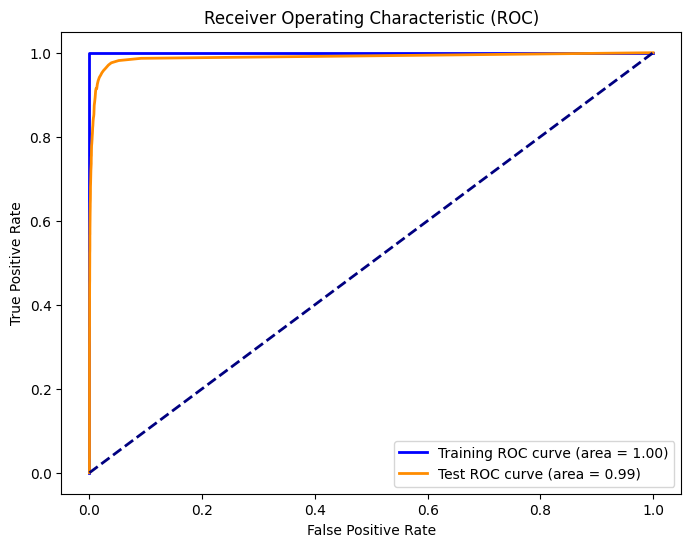

Training Misclassification Rate: 0.0000
Test Misclassification Rate: 0.0107
Out of Bag Error Estimate: 0.0078
Difference between OOB Error and Test Error: 0.0029


In [17]:


# Train a Random Forest with class_weight='balanced'
rf = RandomForestClassifier(class_weight='balanced', oob_score=True, n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Predictions
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

# Confusion Matrix
print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred))
print("\nTest Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred))

# ROC and AUC
y_train_prob = rf.predict_proba(X_train)[:, 1]
y_test_prob = rf.predict_proba(X_test)[:, 1]

fpr_train, tpr_train, _ = roc_curve(y_train, y_train_prob)
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_prob)

roc_auc_train = auc(fpr_train, tpr_train)
roc_auc_test = auc(fpr_test, tpr_test)

plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2, label=f'Training ROC curve (area = {roc_auc_train:.2f})')
plt.plot(fpr_test, tpr_test, color='darkorange', lw=2, label=f'Test ROC curve (area = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

# Misclassification Rate
misclassification_train = 1 - accuracy_score(y_train, y_train_pred)
misclassification_test = 1 - accuracy_score(y_test, y_test_pred)

print(f"Training Misclassification Rate: {misclassification_train:.4f}")
print(f"Test Misclassification Rate: {misclassification_test:.4f}")

# OOB Error
oob_error = 1 - rf.oob_score_
print(f"Out of Bag Error Estimate: {oob_error:.4f}")

# Comparing OOB Error with Test Error
print(f"Difference between OOB Error and Test Error: {abs(oob_error - misclassification_test):.4f}")


### comparison with 1c: both the test and OOB error are slightly higher after handling class imbalance

# 1 (e)

XGBoost and Model Trees


1. Use L1 penalized logistic regression at each node. Use XGBoost to fit the model tree. 
2. Determine α (the regularization term) using cross-validation. 
3. Use one of 5 fold, 10 fold, and leave-one-out cross validation methods to estimate the error of your trained
model and compare it with the test error. 
4. Report the Confusion Matrix, ROC, and AUC for training and test sets.

In [23]:

# Parameter grid 
param_grid = {
    'booster': ['gbtree'],
    'reg_alpha': [0.001, 0.01, 0.1, 1, 10, 100]  # Vary the L1 regularization strength.
}

# Initialize the model
xgb_model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss')

# CV method
cv_method = 5

clf = GridSearchCV(xgb_model, param_grid, scoring='roc_auc', cv=cv_method)
clf.fit(X_train, y_train)

# Print the best parameters and score
print("Best Parameters:", clf.best_params_)
print("Best CV Score:", clf.best_score_)

# Predict probabilities
train_probs = clf.predict_proba(X_train)[:,1]
test_probs = clf.predict_proba(X_test)[:,1]

# ROC and AUC
fpr_train, tpr_train, _ = roc_curve(y_train, train_probs)
fpr_test, tpr_test, _ = roc_curve(y_test, test_probs)

roc_auc_train = auc(fpr_train, tpr_train)
roc_auc_test = auc(fpr_test, tpr_test)

# Predict classes
train_preds = clf.predict(X_train)
test_preds = clf.predict(X_test)

# Misclassification rate
misclassification_train = 1 - accuracy_score(y_train, train_preds)
misclassification_test = 1 - accuracy_score(y_test, test_preds)


# Confusion Matrix
confusion_train = confusion_matrix(y_train, clf.predict(X_train))
confusion_test = confusion_matrix(y_test, clf.predict(X_test))

# Print Results
print(f"Results with {cv_method}-fold CV:")
print("Train AUC:", roc_auc_train)
print("Test AUC:", roc_auc_test)
print("Train Misclassification Rate:", misclassification_train)
print("Test Misclassification Rate:", misclassification_test)
print("Train Confusion Matrix:")
print(confusion_train)
print("Test Confusion Matrix:")
print(confusion_test)
print("-" * 50)


Best Parameters: {'booster': 'gbtree', 'reg_alpha': 1}
Best CV Score: 0.9904519491525423
Results with 5-fold CV:
Train AUC: 1.0
Test AUC: 0.9957097813333333
Train Misclassification Rate: 0.0
Test Misclassification Rate: 0.006437499999999985
Train Confusion Matrix:
[[59000     0]
 [    0  1000]]
Test Confusion Matrix:
[[15606    19]
 [   84   291]]
--------------------------------------------------


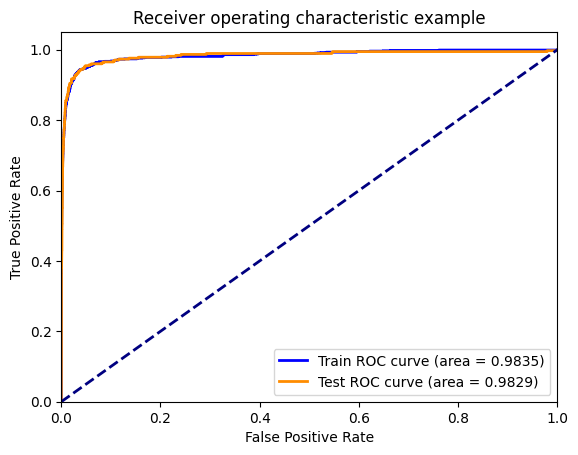

In [24]:


plt.figure()
lw = 2
plt.plot(fpr_train, tpr_train, color='blue',
         lw=lw, label='Train ROC curve (area = %0.4f)' % roc_auc_train)
plt.plot(fpr_test, tpr_test, color='darkorange',
         lw=lw, label='Test ROC curve (area = %0.4f)' % roc_auc_test)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()


# 1 (f)

1. DONE - Use SMOTE (Synthetic Minority Over-sampling Technique) to pre-process your data to compensate for class imbalance. 
2. DONE - Train XGBosst with L 1 penalized logistic regression at each node using the pre-processed data 
3. DONE - Determine α (the regularization term) using cross-validation. 
4. DONE - Use one of 5 fold, 10 fold, and leave-one-out cross validation methods to estimate the error of your trainedbmodel and compare it with the test error. 
5. DONE - Report the Confusion Matrix, ROC, and AUC for training and test sets.
6. DONE - Compare the uncompensated case with SMOTE case

In [9]:
#This code block uses SMOTE after splitting up training vs validation set to avoid data leakage

warnings.filterwarnings("ignore")

# Cross-validation setup
cv_method = StratifiedKFold(n_splits=5)  # Using StratifiedKFold to maintain class distribution

# Parameter for XGBoost with L1 penalized logistic regression at each node
param_grid = {
    'booster': ['gbtree'],
    'reg_alpha': [0.001, 0.01, 0.1, 1, 10, 100]  # L1 regularization strengths
}


# Initialize the model
xgb_model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss')

# Placeholder lists to store results
auc_scores = []
misclassification_rates = []
best_alphas = []

#iterating through each of the 5 folds to determine best alpha
for train_idx, val_idx in cv_method.split(X_train, y_train):

    #setting the train and validation data basked on the current fold
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

    # Apply SMOTE only on the training data only
    smote = SMOTE(random_state=42)
    X_train_fold_resampled, y_train_fold_resampled = smote.fit_resample(X_train_fold, y_train_fold)
    
    # Grid search with XGBoost model
    clf = GridSearchCV(xgb_model, param_grid, scoring='roc_auc', cv=3)  # Using 3-fold CV for the GridSearch
    clf.fit(X_train_fold_resampled, y_train_fold_resampled)
    
    # Record the best reg_alpha for this fold
    best_alphas.append(clf.best_params_['reg_alpha'])

    # Validate the model on the original, non-SMOTEd validation set
    val_probs = clf.predict_proba(X_val_fold)[:,1]
    val_preds = clf.predict(X_val_fold)
    
    # Calculate and store AUC and misclassification rate for this fold
    fold_auc = roc_auc_score(y_val_fold, val_probs)
    fold_misclassification = 1 - accuracy_score(y_val_fold, val_preds)
    
    auc_scores.append(fold_auc)
    misclassification_rates.append(fold_misclassification)

# Determine the most frequent best alpha value

best_alpha = Counter(best_alphas).most_common(1)[0][0]

print("Most Frequent Best alpha:", best_alpha)


# Print average results
print("Average AUC across folds:", sum(auc_scores)/len(auc_scores))
print("Average Misclassification Rate across folds:", sum(misclassification_rates)/len(misclassification_rates))


Most Frequent Best alpha: 1
Average AUC across folds: 0.989538813559322
Average Misclassification Rate across folds: 0.006916666666666638


Training Results:
Train AUC: 0.9999999999999999
Train Misclassification Rate: 0.0
Train Confusion Matrix:
[[59000     0]
 [    0 59000]]
--------------------------------------------------
Test Results:
Test AUC: 0.9946914133333333
Test Misclassification Rate: 0.007624999999999993
Test Confusion Matrix:
[[15569    56]
 [   66   309]]
--------------------------------------------------


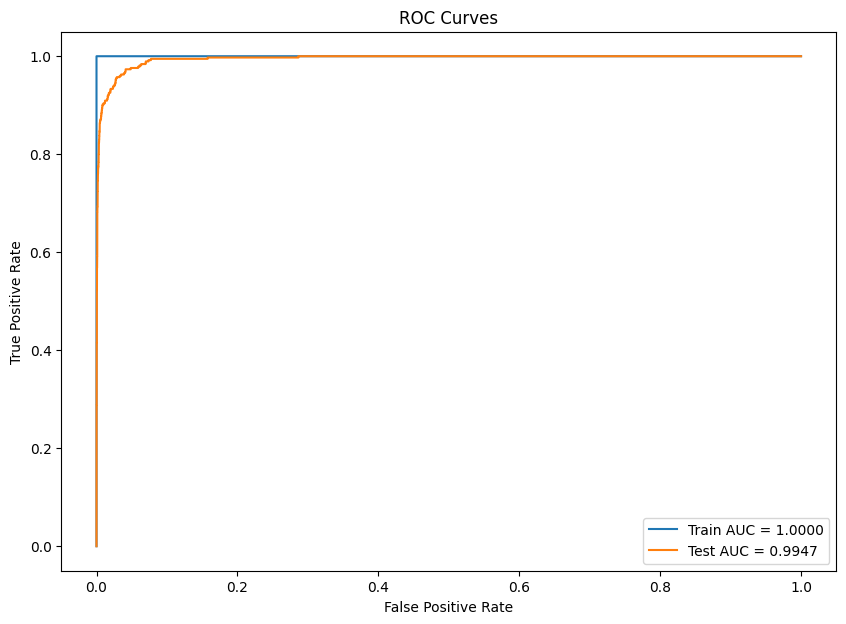

In [24]:
# Now that best alpha has been selected, train on the entire training set with the most frequent best alpha
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

final_xgb_model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', booster='gbtree', reg_alpha=best_alpha)
final_xgb_model.fit(X_train_resampled, y_train_resampled)

# Predict on the test set
test_preds = final_xgb_model.predict(X_test)
test_probs = final_xgb_model.predict_proba(X_test)[:,1]

# Predict on the training set
train_preds = final_xgb_model.predict(X_train_resampled)
train_probs = final_xgb_model.predict_proba(X_train_resampled)[:,1]

# Calculate train errors
train_auc = roc_auc_score(y_train_resampled, train_probs)
train_misclassification = 1 - accuracy_score(y_train_resampled, train_preds)

# Calculate test errors
test_auc = roc_auc_score(y_test, test_probs)
test_misclassification = 1 - accuracy_score(y_test, test_preds)

# Confusion Matrix
confusion_train = confusion_matrix(y_train_resampled, train_preds)
confusion_test = confusion_matrix(y_test, test_preds)

# Print Results
print("Training Results:")
print("Train AUC:", train_auc)
print("Train Misclassification Rate:", train_misclassification)
print("Train Confusion Matrix:")
print(confusion_train)
print("-" * 50)

print("Test Results:")
print("Test AUC:", test_auc)
print("Test Misclassification Rate:", test_misclassification)
print("Test Confusion Matrix:")
print(confusion_test)
print("-" * 50)

# ROC Curves
train_fpr, train_tpr, _ = roc_curve(y_train_resampled, train_probs)
test_fpr, test_tpr, _ = roc_curve(y_test, test_probs)

plt.figure(figsize=(10, 7))
plt.plot(train_fpr, train_tpr, label=f"Train AUC = {train_auc:.4f}")
plt.plot(test_fpr, test_tpr, label=f"Test AUC = {test_auc:.4f}")
plt.title('ROC Curves')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.show()


### Uncompensated case had a test misclassification rate of 0.006437499999999985 while the SMOTE case had a test misclassification rate of 0.007624999999999993

# ISLR 6.6.3 & 6.6.5

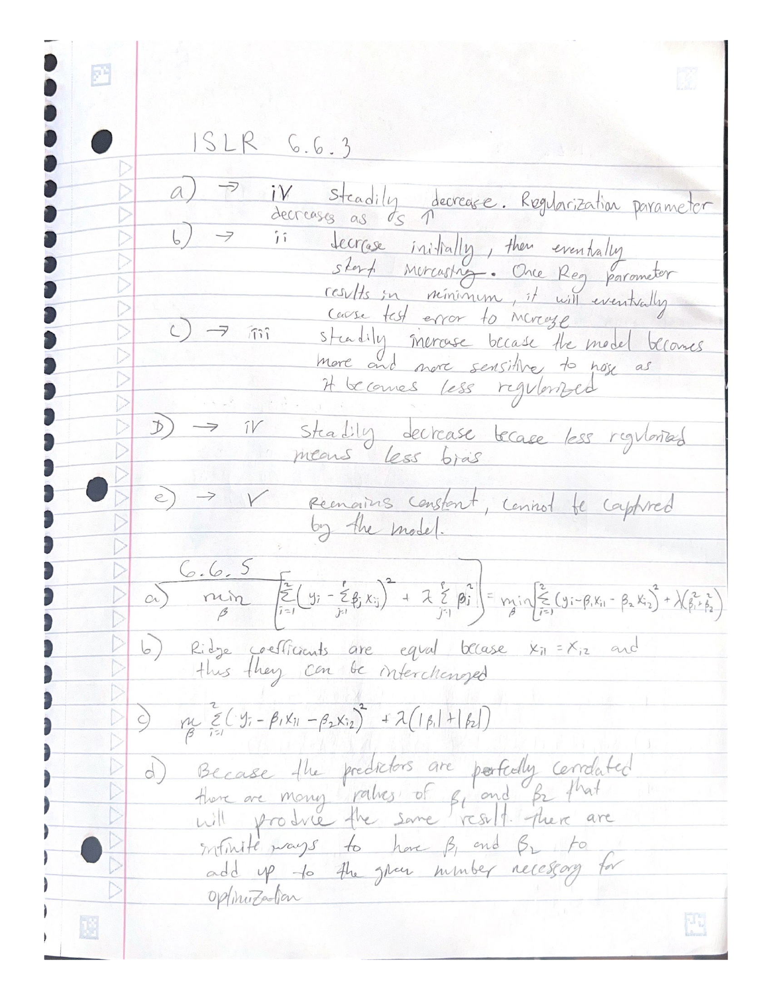

In [28]:

# Convert PDF to list of images
images = convert_from_path('../data/hw 6 ISLR.pdf')

# Display the first page (adjust the index for other pages)
display(images[0])

# ISLR 8.4.5 and 9.7.3

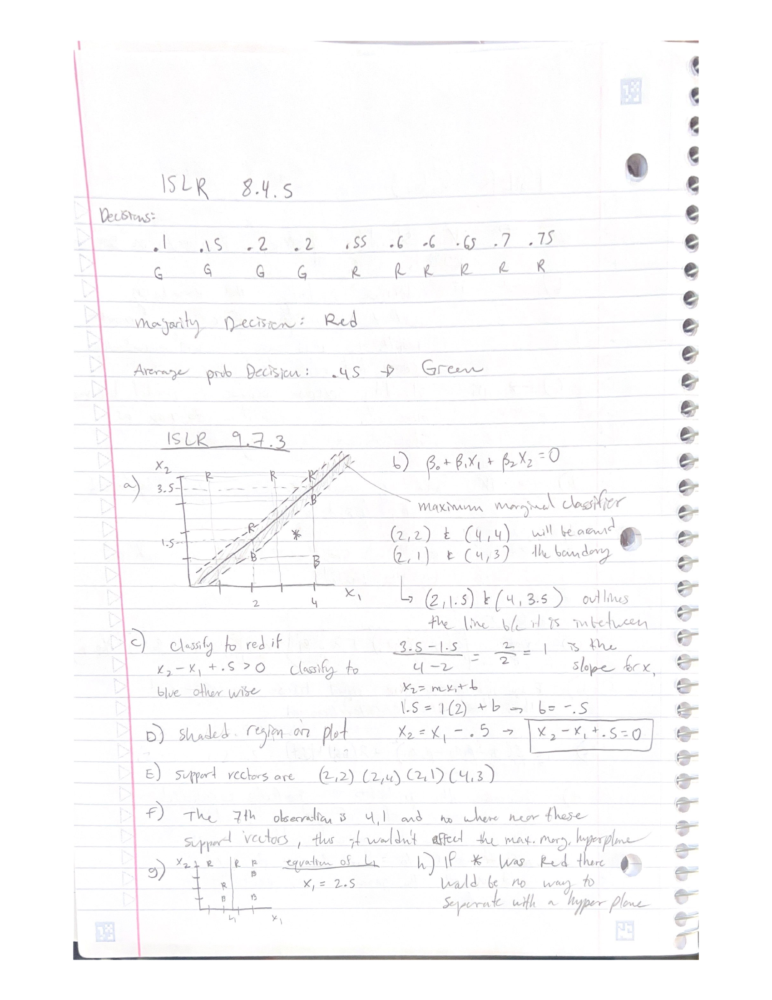

In [29]:
display(images[1])